## Initial setup

In [ ]:
#@title Install the required libs
!pip install -U -qq git+https://github.com/huggingface/diffusers.git
!pip install -qq accelerate transformers ftfy

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 2.0 MB/s eta 0:00:00


In [ ]:
#@title [Optional] Install xformers for faster and memory efficient training
#@markdown Acknowledgement: The xformers wheel are taken from [TheLastBen/fast-stable-diffusion](https://github.com/TheLastBen/fast-stable-diffusion). Thanks a lot for building these wheels!
%%time

!pip install -U --pre triton

from subprocess import getoutput
from IPython.display import HTML
from IPython.display import clear_output
import time

s = getoutput('nvidia-smi')
if 'T4' in s:
  gpu = 'T4'
elif 'P100' in s:
  gpu = 'P100'
elif 'V100' in s:
  gpu = 'V100'
elif 'A100' in s:
  gpu = 'A100'

while True:
    try:
        gpu=='T4'or gpu=='P100'or gpu=='V100'or gpu=='A100'
        break
    except:
        pass
    print('[1;31mit seems that your GPU is not supported at the moment')
    time.sleep(5)

if (gpu=='T4'):
  %pip install -q https://github.com/TheLastBen/fast-stable-diffusion/raw/main/precompiled/T4/xformers-0.0.13.dev0-py3-none-any.whl

elif (gpu=='P100'):
  %pip install -q https://github.com/TheLastBen/fast-stable-diffusion/raw/main/precompiled/P100/xformers-0.0.13.dev0-py3-none-any.whl

elif (gpu=='V100'):
  %pip install -q https://github.com/TheLastBen/fast-stable-diffusion/raw/main/precompiled/V100/xformers-0.0.13.dev0-py3-none-any.whl

elif (gpu=='A100'):
  %pip install -q https://github.com/TheLastBen/fast-stable-diffusion/raw/main/precompiled/A100/xformers-0.0.13.dev0-py3-none-any.whl

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 209.5/209.5 MB 9.0 MB/s eta 0:00:00
  ERROR: HTTP error 404 while getting https://github.com/TheLastBen/fast-stable-diffusion/raw/main/precompiled/A100/xformers-0.0.13.dev0-py3-none-any.whl
ERROR: Could not install requirement xformers==0.0.13.dev0 from https://github.com/TheLastBen/fast-stable-diffusion/raw/main/precompiled/A100/xformers-0.0.13.dev0-py3-none-any.whl because of HTTP error 404 Client Error: Not Found for url: https://github.com/TheLastBen/fast-stable-diffusion/raw/main/precompiled/A100/xformers-0.0.13.dev0-py3-none-any.whl for URL https://github.com/TheLastBen/fast-stable-diffusion/raw/main/precompiled/A100/xformers-0.0.13.dev0-py3-none-any.whl
CPU times: user 93.3 ms, sys: 19.2 ms, total: 112 ms
Wall time: 10.6 s


In [ ]:
#@title Import required libraries
import argparse
import itertools
import math
import os
import random

import numpy as np
import torch
import torch.nn.functional as F
import torch.utils.checkpoint
from torch.utils.data import Dataset

import PIL
from accelerate import Accelerator
from accelerate.logging import get_logger
from accelerate.utils import set_seed
from diffusers import AutoencoderKL, DDPMScheduler, PNDMScheduler, StableDiffusionPipeline, UNet2DConditionModel
from diffusers.optimization import get_scheduler
from diffusers.pipelines.stable_diffusion import StableDiffusionSafetyChecker
from PIL import Image
from torchvision import transforms
from tqdm.auto import tqdm
from transformers import CLIPFeatureExtractor, CLIPTextModel, CLIPTokenizer

def image_grid(imgs, rows, cols):
    assert len(imgs) == rows*cols

    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    grid_w, grid_h = grid.size

    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

# Load Model

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
from diffusers import StableDiffusionPipeline
import torch


model_path = "/content/drive/My Drive/DL_project/SD_without_prompt"


# pipe = StableDiffusionPipeline.from_pretrained(model_path, torch_dtype=torch.float16)
pipe = StableDiffusionPipeline.from_pretrained(
    model_path,
    safety_checker=None
)
pipe = pipe.to("cuda")


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


In [ ]:
vae = AutoencoderKL.from_pretrained(model_path, subfolder="vae")
text_encoder = CLIPTextModel.from_pretrained(model_path, subfolder="text_encoder")
tokenizer = CLIPTokenizer.from_pretrained(model_path, subfolder="tokenizer")
unet = UNet2DConditionModel.from_pretrained(model_path, subfolder="unet")

vae = vae.to("cuda")
text_encoder = text_encoder.to("cuda")
unet = unet.to("cuda")

In [ ]:
#@markdown `pretrained_model_name_or_path` which Stable Diffusion checkpoint you want to use
pretrained_model_name_or_path = "CompVis/stable-diffusion-v1-4" #@param ["stabilityai/stable-diffusion-2", "stabilityai/stable-diffusion-2-base", "CompVis/stable-diffusion-v1-4", "runwayml/stable-diffusion-v1-5"] {allow-input: true}

# Load Image

In [ ]:
from torch.utils.data import Dataset, DataLoader

In [ ]:
from torchvision import transforms

class CustomDataset(Dataset):
    def __init__(self, image_dir, prompt, tokenizer, target_size=(256, 768)):
        self.image_dir = image_dir
        self.prompt = prompt
        self.tokenizer = tokenizer
        self.image_paths = [os.path.join(image_dir, file) for file in os.listdir(image_dir)]
        self.target_size = target_size

        self.image_transform = transforms.Compose([
            transforms.Resize(self.target_size),
            transforms.ToTensor(),
        ])

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image_path = self.image_paths[idx]
        image = Image.open(image_path).convert("RGB")

        pixel_values = self.image_transform(image)

        prompt_ids = self.tokenizer(self.prompt, return_tensors="pt", padding="max_length", truncation=True, max_length=77).input_ids.squeeze()

        return {
            "pixel_values": pixel_values,
            "prompt_ids": prompt_ids,
        }


In [ ]:
tokenizer = pipe.tokenizer

In [ ]:
image_dir = "/content/drive/My Drive/DL_project/cropped_images"
prompt = "cuneiform 3 ancient icons"
dataset = CustomDataset(image_dir, prompt, tokenizer)
batch_size = 1

dataloader = DataLoader(dataset, batch_size=1, shuffle=True)

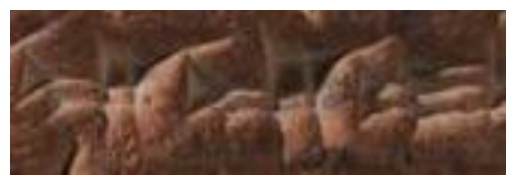

In [ ]:
import matplotlib.pyplot as plt
from torchvision.transforms.functional import to_pil_image

batch = next(iter(dataloader))

pixel_values = batch["pixel_values"]
prompt_ids = batch["prompt_ids"]


image = to_pil_image(pixel_values[0]) # the first image


plt.imshow(image)
plt.axis("off")
plt.show()


# Finetune without prompt

In [ ]:
torch.cuda.empty_cache()
!export PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True


In [ ]:
text_encoder = pipe.text_encoder
unet = pipe.unet
tokenizer = pipe.tokenizer

In [ ]:
from transformers import CLIPTextModel
from diffusers import StableDiffusionPipeline
from peft import LoraConfig, get_peft_model

model_id = "CompVis/stable-diffusion-v1-4"
lora_config = LoraConfig(
    r=8,
    lora_alpha=16,
    target_modules=["to_q", "to_k", "to_v"],
    lora_dropout=0.1,
    task_type="IMAGE_GENERATION"
)


unet = get_peft_model(unet, lora_config)

In [ ]:
from torch.optim import AdamW
from torch.nn.functional import mse_loss
from tqdm import tqdm
import torch

optimizer = AdamW(unet.parameters(), lr=5e-5)
num_epochs = 5
device = "cuda"
num_timesteps = 1000

from diffusers import DDPMScheduler
scheduler = DDPMScheduler(num_train_timesteps=num_timesteps)

for epoch in range(num_epochs):
    for batch in tqdm(dataloader):
        pixel_values = batch["pixel_values"].to(device)
        prompt_ids = batch["prompt_ids"].to(device)

        optimizer.zero_grad()

        with torch.no_grad():
            encoder_hidden_states = text_encoder(prompt_ids).last_hidden_state

        latents = pipe.vae.encode(pixel_values).latent_dist.sample()
        noise = torch.randn_like(latents)
        timesteps = torch.randint(0, num_timesteps, (latents.shape[0],), device=device).long()
        noisy_latents = scheduler.add_noise(latents, noise, timesteps)


        noise_pred = unet(
            sample=noisy_latents,
            timestep=timesteps,
            encoder_hidden_states=encoder_hidden_states,
        ).sample

        loss = mse_loss(noise_pred, noise)

        loss.backward()
        optimizer.step()

    print(f"Epoch {epoch+1}/{num_epochs}, Loss: {loss.item()}")

100%|██████████| 201/201 [00:42<00:00,  4.70it/s]


Epoch 1/5, Loss: 1.2196599245071411


100%|██████████| 201/201 [00:37<00:00,  5.36it/s]


Epoch 2/5, Loss: 0.8053790926933289


100%|██████████| 201/201 [00:37<00:00,  5.34it/s]


Epoch 3/5, Loss: 0.7181655764579773


100%|██████████| 201/201 [00:37<00:00,  5.32it/s]


Epoch 4/5, Loss: 0.05874660611152649


100%|██████████| 201/201 [00:37<00:00,  5.31it/s]


Epoch 5/5, Loss: 0.0008059061365202069


In [ ]:
unet.save_pretrained("/content/drive/My Drive/DL_project/lora_fine_tuned_unet_withoutprompt")

In [ ]:
from peft import PeftModel
unet = PeftModel.from_pretrained(unet, "/content/drive/My Drive/DL_project/lora_fine_tuned_unet_withoutprompt")
pipe.unet = unet

In [ ]:
from diffusers import StableDiffusionPipeline
from PIL import Image
import torch

height, width = 256, 768
rows, cols = 5, 2
spacing = 20


images = []
prompt = "a photo of three cuneiform icons"
for i in range(rows * cols):
    with torch.no_grad():
        image = pipe(prompt, height=height, width=width).images[0]
    images.append(image)


canvas_width = width * cols + spacing * (cols - 1)
canvas_height = height * rows + spacing * (rows - 1)
canvas = Image.new("RGB", (canvas_width, canvas_height), color="white")


for idx, img in enumerate(images):
    x_offset = (idx % cols) * (width + spacing)
    y_offset = (idx // cols) * (height + spacing)
    canvas.paste(img, (x_offset, y_offset))

canvas.save("combined_cuneiform_icons_with_spacing.png")
print("Combined image with spacing saved!")

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Combined image with spacing saved!


# Finetune with prompt

In [ ]:
import pandas as pd

metadata_path = "/content/drive/My Drive/DL_project/metadata.csv"
metadata = pd.read_csv(metadata_path)

label_to_name = dict(zip(metadata["mzl_label"], metadata["name"]))


In [ ]:
from torch.utils.data import Dataset, DataLoader
from PIL import Image
from transformers import CLIPTokenizer
import pandas as pd
import os
import torch
from torchvision import transforms

class CustomDataset(Dataset):
    def __init__(self, image_dir, metadata_path, tokenizer, target_size=(256, 768)):
        self.image_dir = image_dir
        self.metadata = pd.read_csv(metadata_path)
        self.label_to_name = dict(zip(self.metadata["mzl_label"], self.metadata["name"]))
        self.image_paths = [os.path.join(image_dir, f) for f in os.listdir(image_dir) if f.endswith(".jpg")]
        self.tokenizer = tokenizer
        self.target_size = target_size

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image_path = self.image_paths[idx]
        filename = os.path.basename(image_path)

        labels = filename.split("_")[:3]
        names = [self.label_to_name.get(int(label), "UNKNOWN") for label in labels]


        intro_text = "Depicting ancient cuneiform symbols:"
        prompt = intro_text + " " + " ".join(names)


        image = Image.open(image_path).convert("RGB")
        image = image.resize(self.target_size)


        pixel_values = transforms.ToTensor()(image)

        prompt_ids = self.tokenizer(prompt, return_tensors="pt", padding="max_length", truncation=True, max_length=77).input_ids.squeeze()

        return {
            "pixel_values": pixel_values,
            "prompt_ids": prompt_ids
        }


In [ ]:
from diffusers import StableDiffusionPipeline
from peft import LoraConfig, get_peft_model

model_path = "/content/drive/My Drive/DL_project/SD_with_prompt"
pipe = StableDiffusionPipeline.from_pretrained(model_path, safety_checker=None )
pipe = pipe.to("cuda")
text_encoder = pipe.text_encoder
unet = pipe.unet
tokenizer = pipe.tokenizer

In [ ]:
image_dir = "/content/drive/My Drive/DL_project/cropped_images"
metadata_path = "/content/drive/My Drive/DL_project/metadata.csv"


dataset = CustomDataset(image_dir, metadata_path, tokenizer, target_size=(256, 768))
dataloader = DataLoader(dataset, batch_size=1, shuffle=True)

for batch in dataloader:
    print(batch["prompt_ids"].shape, batch["pixel_values"].shape)
    break


torch.Size([1, 77]) torch.Size([1, 3, 256, 768])


In [ ]:
unet = get_peft_model(unet, lora_config)

In [ ]:
from diffusers import StableDiffusionPipeline
from peft import LoraConfig, get_peft_model

best_loss = float('inf')  # Initialize with infinity
best_model_path = "./best_lora_fine_tuned_unet_withprompt"  # Path to save the best model


lora_config = LoraConfig(
    r=8,
    lora_alpha=16,
    target_modules=["to_q", "to_k", "to_v"],
    lora_dropout=0.1,
    task_type="IMAGE_GENERATION"
)


from torch.optim import AdamW
from torch.nn.functional import mse_loss
from tqdm import tqdm
import torch

optimizer = AdamW(unet.parameters(), lr=5e-5)
num_epochs = 10
device = "cuda"
num_timesteps = 1000

from diffusers import DDPMScheduler
scheduler = DDPMScheduler(num_train_timesteps=num_timesteps)

for epoch in range(num_epochs):
    epoch_loss = 0.0  # Track the cumulative loss for the epoch

    for batch in tqdm(dataloader):
        pixel_values = batch["pixel_values"].to(device)
        prompt_ids = batch["prompt_ids"].to(device)

        optimizer.zero_grad()

        with torch.no_grad():
            encoder_hidden_states = text_encoder(prompt_ids).last_hidden_state

        latents = pipe.vae.encode(pixel_values).latent_dist.sample()
        noise = torch.randn_like(latents)
        timesteps = torch.randint(0, num_timesteps, (latents.shape[0],), device=device).long()
        noisy_latents = scheduler.add_noise(latents, noise, timesteps)

        noise_pred = unet(
            sample=noisy_latents,
            timestep=timesteps,
            encoder_hidden_states=encoder_hidden_states,
        ).sample

        loss = mse_loss(noise_pred, noise)

        loss.backward()
        optimizer.step()

        epoch_loss += loss.item()  # Accumulate batch loss into epoch loss

    epoch_loss /= len(dataloader)  # Calculate the average loss for the epoch

    print(f"Epoch {epoch+1}/{num_epochs}, Loss: {epoch_loss}")

    # Check if this is the best loss so far
    if epoch_loss < best_loss:
        best_loss = epoch_loss
        print(f"New best model found at epoch {epoch+1} with loss {best_loss:.4f}")
        unet.save_pretrained(best_model_path)  # Save the model

100%|██████████| 201/201 [00:39<00:00,  5.11it/s]


Epoch 1/10, Loss: 0.34740824309561114
New best model found at epoch 1 with loss 0.3474


100%|██████████| 201/201 [00:39<00:00,  5.08it/s]


Epoch 2/10, Loss: 0.3065694659147342
New best model found at epoch 2 with loss 0.3066


100%|██████████| 201/201 [00:39<00:00,  5.12it/s]


Epoch 3/10, Loss: 0.31677070084758874


100%|██████████| 201/201 [00:39<00:00,  5.13it/s]


Epoch 4/10, Loss: 0.3418277793521043


100%|██████████| 201/201 [00:39<00:00,  5.13it/s]


Epoch 5/10, Loss: 0.3204085856895611


100%|██████████| 201/201 [00:39<00:00,  5.13it/s]


Epoch 6/10, Loss: 0.2990679761996627
New best model found at epoch 6 with loss 0.2991


100%|██████████| 201/201 [00:39<00:00,  5.07it/s]


Epoch 7/10, Loss: 0.33542455032621904


100%|██████████| 201/201 [00:39<00:00,  5.12it/s]


Epoch 8/10, Loss: 0.28136007672561497
New best model found at epoch 8 with loss 0.2814


100%|██████████| 201/201 [00:39<00:00,  5.09it/s]


Epoch 9/10, Loss: 0.274509285858413
New best model found at epoch 9 with loss 0.2745


100%|██████████| 201/201 [00:39<00:00,  5.12it/s]

Epoch 10/10, Loss: 0.3241359473122701


## generate

In [ ]:
unet.save_pretrained("./best_lora_fine_tuned_unet_withprompt")

In [ ]:
from peft import PeftModel
unet = PeftModel.from_pretrained(unet, "/content/drive/My Drive/DL_project/best_lora_fine_tuned_unet_withprompt")
pipe.unet = unet

In [ ]:
import os
from diffusers import StableDiffusionPipeline
from PIL import Image
import torch

cropped_images_dir = "/content/drive/My Drive/DL_project/cropped_images"
output_dir = "/content/drive/My Drive/DL_project/generated_images"
os.makedirs(output_dir, exist_ok=True)


def extract_names_from_filenames(image_dir, label_to_name):
    filenames = [f for f in os.listdir(cropped_images_dir) if f.endswith(".jpg")]
    names = []
    for filename in filenames:
        labels = filename.split("_")[:3]
        try:
            name_parts = [label_to_name.get(int(label), "UNKNOWN") for label in labels]
            name = "_".join(name_parts)
            names.append(name)
        except:
            print(f"Failed to parse {filename}")
    return names


names = extract_names_from_filenames(cropped_images_dir, label_to_name)

selected_names = random.choices(names, k=300)

print(names,selected_names)

['SHA_AN_NAA', 'SHU2_AN_PA', 'DISH_AN_ASH', 'DISH_AN_ASH', 'SHU2_SHA_DISH', 'IG_BU_SHE HU', 'AN_MESH_GAL', 'AN_NAA_NAA', 'ASH_URU_MA', 'GAR_AN_GU', 'LUGAL_UD_TU', 'AN_ASH_SUR', 'AN_ASH_SUR', 'DISH_AN_ASH', 'MU OVER MU_HI TIMES ASH2_ASH', 'KU_TU_UB', 'DISH_AN_ASH', 'SHE_DI_E', 'TAG_KI_IN', 'MESH_I A_A2', 'A_ASH_GU', 'HA_ZI_GAR', 'RI_E2_UM', 'NAA_ALEPH_AD', 'HA_MI_UM', 'E_MU_RU', 'U_DU_AN', 'U2_NAA_ALEPH', 'ISH_MA_A', 'KUR_KUR_I', 'EN TIMES ME_LUGAL_MESH', 'ZE2_SHU2_SHA', 'AN_SAL & TUG2_KID', 'URU_GAR_BA', 'NAA_A_USH2', 'AN_U U U_GISH', 'ASH_TIR_ZE2', 'DISH_AN_ASH', 'SUR_GAL_TU', 'AN_SAL & TUG2_KID', 'UM_SHA3_BI', 'BI_KUR_KUR', 'DISH_AN_ASH', 'GU_ZA_SHU2', 'ASH_UD_MESH', 'LUGAL_SHE HU_SU OVER SU', 'SUR_KAK_A', 'KU_RU_UB', 'KAK_A_LU2', 'SUR_KAK_A', 'SUR_KAK_A', 'U2_KU_NU', 'UD TIMES U PLUS U PLUS U GUNU_GUD TIMES KUR_MAR', 'NI_ZUM_LI', 'LA_NAA_DA', 'UD_GAL_GAL', 'HA_DA_KA', 'E2_LA_TE', 'NI_SHU2_NU', 'NU_TE_GAR', 'KUR_ASH2_NI', 'HA_DA_AK', 'BA_NU_UD', 'A_A_A', 'LI_DA_TE', 'MA_HI TIMES ASH2

In [ ]:
import os
import torch

output_dir = "/content/drive/My Drive/DL_project/generated_images_before_finetuning_300"
os.makedirs(output_dir, exist_ok=True)


height, width = 256, 768


for idx, name in enumerate(selected_names, start=1):

    prompt = f"Depicting 3 ancient cuneiform symbols: {name}"


    with torch.no_grad():

        image = pipe(prompt, height=height, width=width).images[0]


    output_filename = f"{name}_{idx:03d}.jpg"
    output_path = os.path.join(output_dir, output_filename)
    image.save(output_path)
    print(f"Saved: {output_path}")

print("All images generated and saved!")


In [ ]:
import os
from diffusers import StableDiffusionPipeline
from PIL import Image
import torch

cropped_images_dir = "/content/drive/My Drive/DL_project/cropped_images"
output_dir = "/content/drive/My Drive/DL_project/generated_images"
os.makedirs(output_dir, exist_ok=True)


def extract_names_from_filenames(image_dir, label_to_name):
    filenames = [f for f in os.listdir(cropped_images_dir) if f.endswith(".jpg")]
    names = []
    for filename in filenames:
        labels = filename.split("_")[:3]
        try:
            name_parts = [label_to_name.get(int(label), "UNKNOWN") for label in labels]
            name = "_".join(name_parts)
            names.append(name)
        except:
            print(f"Failed to parse {filename}")
    return names


names = extract_names_from_filenames(cropped_images_dir, label_to_name)

selected_names = random.choices(names, k=300)

print(names,selected_names)

['SHA_AN_NAA', 'SHU2_AN_PA', 'DISH_AN_ASH', 'DISH_AN_ASH', 'SHU2_SHA_DISH', 'IG_BU_SHE HU', 'AN_MESH_GAL', 'AN_NAA_NAA', 'ASH_URU_MA', 'GAR_AN_GU', 'LUGAL_UD_TU', 'AN_ASH_SUR', 'AN_ASH_SUR', 'DISH_AN_ASH', 'MU OVER MU_HI TIMES ASH2_ASH', 'KU_TU_UB', 'DISH_AN_ASH', 'SHE_DI_E', 'TAG_KI_IN', 'MESH_I A_A2', 'A_ASH_GU', 'HA_ZI_GAR', 'RI_E2_UM', 'NAA_ALEPH_AD', 'HA_MI_UM', 'E_MU_RU', 'U_DU_AN', 'U2_NAA_ALEPH', 'ISH_MA_A', 'KUR_KUR_I', 'EN TIMES ME_LUGAL_MESH', 'ZE2_SHU2_SHA', 'AN_SAL & TUG2_KID', 'URU_GAR_BA', 'NAA_A_USH2', 'AN_U U U_GISH', 'ASH_TIR_ZE2', 'DISH_AN_ASH', 'SUR_GAL_TU', 'AN_SAL & TUG2_KID', 'UM_SHA3_BI', 'BI_KUR_KUR', 'DISH_AN_ASH', 'GU_ZA_SHU2', 'ASH_UD_MESH', 'LUGAL_SHE HU_SU OVER SU', 'SUR_KAK_A', 'KU_RU_UB', 'KAK_A_LU2', 'SUR_KAK_A', 'SUR_KAK_A', 'U2_KU_NU', 'UD TIMES U PLUS U PLUS U GUNU_GUD TIMES KUR_MAR', 'NI_ZUM_LI', 'LA_NAA_DA', 'UD_GAL_GAL', 'HA_DA_KA', 'E2_LA_TE', 'NI_SHU2_NU', 'NU_TE_GAR', 'KUR_ASH2_NI', 'HA_DA_AK', 'BA_NU_UD', 'A_A_A', 'LI_DA_TE', 'MA_HI TIMES ASH2

In [ ]:
import os
from diffusers import StableDiffusionPipeline
from PIL import Image
import torch

cropped_images_dir = "/content/drive/My Drive/DL_project/cropped_images"
output_dir = "/content/drive/My Drive/DL_project/generated_images"
os.makedirs(output_dir, exist_ok=True)


def extract_names_from_filenames(image_dir, label_to_name):
    filenames = [f for f in os.listdir(cropped_images_dir) if f.endswith(".jpg")]
    names = []
    for filename in filenames:
        labels = filename.split("_")[:3]
        try:
            name_parts = [label_to_name.get(int(label), "UNKNOWN") for label in labels]
            name = "_".join(name_parts)
            names.append(name)
        except:
            print(f"Failed to parse {filename}")
    return names


names = extract_names_from_filenames(cropped_images_dir, label_to_name)

selected_names = random.choices(names, k=300)

print(names,selected_names)

['SHA_AN_NAA', 'SHU2_AN_PA', 'DISH_AN_ASH', 'DISH_AN_ASH', 'SHU2_SHA_DISH', 'IG_BU_SHE HU', 'AN_MESH_GAL', 'AN_NAA_NAA', 'ASH_URU_MA', 'GAR_AN_GU', 'LUGAL_UD_TU', 'AN_ASH_SUR', 'AN_ASH_SUR', 'DISH_AN_ASH', 'MU OVER MU_HI TIMES ASH2_ASH', 'KU_TU_UB', 'DISH_AN_ASH', 'SHE_DI_E', 'TAG_KI_IN', 'MESH_I A_A2', 'A_ASH_GU', 'HA_ZI_GAR', 'RI_E2_UM', 'NAA_ALEPH_AD', 'HA_MI_UM', 'E_MU_RU', 'U_DU_AN', 'U2_NAA_ALEPH', 'ISH_MA_A', 'KUR_KUR_I', 'EN TIMES ME_LUGAL_MESH', 'ZE2_SHU2_SHA', 'AN_SAL & TUG2_KID', 'URU_GAR_BA', 'NAA_A_USH2', 'AN_U U U_GISH', 'ASH_TIR_ZE2', 'DISH_AN_ASH', 'SUR_GAL_TU', 'AN_SAL & TUG2_KID', 'UM_SHA3_BI', 'BI_KUR_KUR', 'DISH_AN_ASH', 'GU_ZA_SHU2', 'ASH_UD_MESH', 'LUGAL_SHE HU_SU OVER SU', 'SUR_KAK_A', 'KU_RU_UB', 'KAK_A_LU2', 'SUR_KAK_A', 'SUR_KAK_A', 'U2_KU_NU', 'UD TIMES U PLUS U PLUS U GUNU_GUD TIMES KUR_MAR', 'NI_ZUM_LI', 'LA_NAA_DA', 'UD_GAL_GAL', 'HA_DA_KA', 'E2_LA_TE', 'NI_SHU2_NU', 'NU_TE_GAR', 'KUR_ASH2_NI', 'HA_DA_AK', 'BA_NU_UD', 'A_A_A', 'LI_DA_TE', 'MA_HI TIMES ASH2

In [ ]:
import os
import torch

output_dir = "/content/drive/My Drive/DL_project/generated_images_after_finetuning_300"
os.makedirs(output_dir, exist_ok=True)


height, width = 256, 768


for idx, name in enumerate(selected_names, start=1):

    prompt = f"Depicting 3 ancient cuneiform symbols: {name}"


    with torch.no_grad():

        image = pipe(prompt, height=height, width=width).images[0]


    output_filename = f"{name}_{idx:03d}.jpg"
    output_path = os.path.join(output_dir, output_filename)
    image.save(output_path)
    print(f"Saved: {output_path}")

print("All images generated and saved!")


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/U2_ERIN2_BI_001.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/I_RI_LA_002.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/URU_SHA3_URU_003.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/DU_UR_MU_004.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/UB_NAA_I A_005.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/RA_GAL_UD_006.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/ASH_UD_ME_007.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/GAR_AN_SAL & TUG2_008.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/URU_GAR_BA_009.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/RU_UB_BU_010.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/HA_BI_RI_011.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/AN_SAL & TUG2_KID_012.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/LI_AN OVER AN_MA_013.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/AD_A2_SUR_014.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/A_A_NAA_015.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/ASH_BU_UD_016.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/SUR_KAK_A_017.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/SHU2_AN_PA_018.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/NU_PA_MI_019.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/UD_U2_BI_020.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/HA_ZI_GAR_021.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/RI_E2_UM_022.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/TI TENU_DI_I_023.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/HA_DA_KA_024.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/PA_TA_NI_025.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/AN_ASH_SUR_026.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/RA_GAL_UD_027.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/AN_KA_GAR_028.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/KA_U2_KAL_029.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/A_KI_MAH_030.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/LA_TA_KASKAL_031.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/U2_KU_NU_032.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/SUR_GAL_TU_033.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/SHU_ASH2_BA_034.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/U2_NAA_ALEPH_035.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/MESH_MA_RU_036.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/AN_SAL & TUG2_KID_037.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/TUK_RI_LI_038.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/RA_GAL_UD_039.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/U2_ERIN2_BI_040.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/ZU_U_UD_041.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/LI_TA_NAA_042.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/AN_NU_U_043.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/U2_ERIN2_BI_044.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/AN_IM_SHESH_045.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/U_PA_NI_046.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/GAR_AN_SAL & TUG2_047.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/SHU_U_NI_048.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/U_PA_NI_049.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/I_A_LAGAB TIMES HAL_050.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/DISH_AN_ASH_051.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/MESH_MA_RU_052.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/A_AN_TA_053.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/U2_KU_NU_054.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/SHAH_SA_PIRIG TIMES ZA_055.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/DISH_AN_ASH_056.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/ASH_ZE2_RI_057.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/ME_HI_KI_058.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/MU_U_ASH_059.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/E_NAA_DA_060.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/LAM_KA_KA_061.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/KAK_SILA3_RI_062.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/E_MU_RU_063.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/E_DI_RI_064.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/UB_NAA_I A_065.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/IGI_MU_U2_066.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/U2_HA_DI_067.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/I_RI_LA_068.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/DI_SHU2_NU_069.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/AN_KA_GAR_070.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/SAR_RA_SILA3_071.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/I_NI_KI_072.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/U2_KU_NU_073.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/NI_SHU2_NU_074.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/MESH_MA_RU_075.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/DI_IR_KU_076.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/GA_MA_RU_077.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/LU_A_NAA_078.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/AN_MESH_GAL_079.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/ASH_URU_MA_080.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/LA_TA_KASKAL_081.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/E_DI_RI_082.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/UD TIMES U PLUS U PLUS U GUNU_A_LAGAB TIMES HAL_083.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/AN_USH2_AB2_084.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/SI_SI_I_085.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/E_NAA_DA_086.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/AN_MESH_GAL_087.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/URU_SHA3_URU_088.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/SAL_A_NAA_089.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/SUR_KAK_A_090.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/TI TENU_DI_I_091.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/ISH_MA_A_092.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/AN_IM_SHESH_093.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/TI TENU_DI_I_094.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/LA_TA_KASKAL_095.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/MESH_MI_HI_096.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/NU_NI_KI_097.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/U2_KA_LU_098.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/AN_ASH_SUR_099.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/URU_SHA3_URU_100.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/TA_HI_AL_101.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/A_SAR_AK TIMES ERIN2_102.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/IGI_MU_U2_103.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/E_I_SHU_104.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/MESH_SHE_MESH_105.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/DISH_AN_ASH_106.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/A_A_A_107.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/SHU_U_NI_108.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/CUNEIFORM SIGN DIN KASKAL U GUNU DISH_U_NI_109.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/UD TIMES U PLUS U PLUS U GUNU_A_LAGAB TIMES HAL_110.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/NU_TE_LUGAL_111.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/LU_A_NAA_112.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/LI_TA_NAA_113.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/TUG2_BAR_DIB_114.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/SHU2_IR_TI TENU_115.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/NIM_IGI_KUR_116.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/TE_BI_RI_117.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/URU_SHA3_URU_118.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/SUR_KAK_A_119.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/SUR_KAK_A_120.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/ASH2_MU_NI_121.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/LUGAL_SHE HU_SU OVER SU_122.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/A_A_A_123.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/SAL_A_NAA_124.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/DISH_AN_ASH_125.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/SUR_GAL_TU_126.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/A_AN_TA_127.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/I A_GIR3_KA_128.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/AD_A2_SUR_129.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/SHU_MA_ASH_130.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/GU_ZA_SHU2_131.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/SHU2_TI TENU_RU_132.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/I_NI_KI_133.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/NU_NI_KI_134.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/TUG2_BAR_DIB_135.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/MESH_MA_RU_136.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/KU_RU_UB_137.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/AN_USH2_AB2_138.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/GU_ZA_SHU2_139.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/KAK_A_LU2_140.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/BI_KUR_KUR_141.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/E_TAR_BU_142.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/MESH_AN_NU_143.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/E_NAA_DA_144.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/UD TIMES U PLUS U PLUS U GUNU_A_LAGAB TIMES HAL_145.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/AN_NAA_MESH_146.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/SHU2_AN_PA_147.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/MU_U_ASH_148.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/DISH_AN_ASH_149.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/LI_TA_NAA_150.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/MA_RU_U_151.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/RU_UB_BU_152.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/UD_BU_TA_153.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/LUGAL_SHE HU_SU OVER SU_154.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/KAK_A_LU2_155.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/GA_MA_RU_156.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/ASH_TIR_ZE2_157.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/NAA_ALEPH_AD_158.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/LI_AN OVER AN_MA_159.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/A_A_A_160.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/U2_KA_LU_161.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/GAR_AN_GU_162.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/KUR_ASH2_NI_163.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/U2_NAA_ALEPH_164.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/NU_TE_LUGAL_165.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/GU_ZA_SHU2_166.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/AD_TI TENU_I_167.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/KU_RU_UB_168.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/NAA_ALEPH_AD_169.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/ASH_NI_MESH_170.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/TI TENU_U_NI_171.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/PA_TA_NI_172.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/HA_ZI_GAR_173.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/SHU2_AN_PA_174.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/I_BA_TU_175.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/GIR3_PAD_A_176.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/MESH_MA_RU_177.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/DISH_AN_ASH_178.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/U2_NAA_ALEPH_179.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/SAL_A_NAA_180.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/KUR_E_LAM_181.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/U_DU_AN_182.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/LA_TA_KASKAL_183.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/KU_U2_LA_184.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/ASH_UD_MESH_185.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/I_NI_KI_186.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/LI_DA_TE_187.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/A_NAA_KU_188.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/KAK_SILA3_RI_189.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/SHU_ASH2_BA_190.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/LAM_KA_KA_191.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/U2_NAA_ALEPH_192.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/PA & IB_BU_RU_193.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/ME_NI_TU_194.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/ASH2_MU_NI_195.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/KU_U2_LA_196.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/LA_PA_NI_197.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/AN_ASH_SUR_198.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/ASH_UD_ME_199.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/LI_TA_NAA_200.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/ASH_UD_ME_201.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/NU_TE_LUGAL_202.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/NU_PA_MI_203.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/AN_NAA_NAA_204.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/A_KI_E_205.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/ZE2_SHU2_SHA_206.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/UD TIMES U PLUS U PLUS U GUNU_A_LAGAB TIMES HAL_207.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/E_MA_LA_208.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/SAL_A_NAA_209.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/PA & IB_BU_RU_210.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/KUR_KUR_I_211.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/U2_ERIN2_BI_212.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/LA_NAA_DA_213.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/TA_HI_AL_214.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/I_A_LAGAB TIMES HAL_215.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/GAR_AN_GU_216.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/SHA_LA_I_217.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/UD TIMES U PLUS U PLUS U GUNU_GUD TIMES KUR_MAR_218.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/E2_LA_TE_219.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/TE_A_TE_220.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/GAR_AN_SAL & TUG2_221.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/RA_GAL_UD_222.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/AD_TI TENU_I_223.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/HA_DA_AK_224.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/DU_UR_MU_225.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/E_NAA_DA_226.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/I_BA_TU_227.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/E_DI_RI_228.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/TI TENU_U_NI_229.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/MESH_MI_HI_230.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/U_PA_NI_231.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/ZU_U_UD_232.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/A_SAR_AK TIMES ERIN2_233.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/HA_DA_KA_234.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/DISH_AN_ASH_235.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/EN TIMES ME_LUGAL_MESH_236.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/TAG_KI_IN_237.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/TI TENU_SHU2_NU_238.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/LA_TA_KASKAL_239.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/ASH2_MU_NI_240.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/AN_SAL & TUG2_KID_241.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/LA_HA_ASH2_242.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/KI_KI_U GUD_243.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/LU_A_NAA_244.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/U2_KU_NU_245.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/ISH_MA_A_246.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/AN_DA_HA_247.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/E_NAA_DA_248.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/I_RI_LA_249.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/EN TIMES ME_LUGAL_MESH_250.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/ASH2_MU_NI_251.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/IN_BU_ASH2_252.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/A_A_A_253.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/NI_SHU2_NU_254.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/AN_USH2_AB2_255.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/URU_SHA3_URU_256.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/A_ASH_GU_257.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/UD_U2_BI_258.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/TE_SAG OVER SAG_IN_259.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/ASH_TIR_ZE2_260.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/UD TIMES U PLUS U PLUS U GUNU_GUD TIMES KUR_MAR_261.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/A_NAA_ME_262.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/A_A_A_263.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/GA_MA_RU_264.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/ZE2_SHU2_SHA_265.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/ZU_U_UD_266.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/I_BA_TU_267.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/KUR_E_LAM_268.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/A_KI_E_269.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/ZA_KAL_KAL_270.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/E_TAR_BU_271.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/NI_SHU2_NU_272.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/KA_SA_SHE_273.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/MA_TA_KA TIMES A_274.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/RI_E2_UM_275.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/AD_TI TENU_I_276.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/UD_GAL_GAL_277.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/KU_U2_LA_278.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/NU_NI_KI_279.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/IG_BU_SHE HU_280.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/MESH_MI_HI_281.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/LU_UD_I_282.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/TA_HI_AL_283.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/HU_KIN_KI_284.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/NAA_BA_TA_285.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/I A_RI_MAH_286.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/LI_AN OVER AN_MA_287.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/ZA_KAL_KAL_288.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/SHA_LA_I_289.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/LA_HA_ASH2_290.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/AN_SAL & TUG2_KID_291.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/UD_U2_BI_292.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/UB_NAA_I A_293.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/TAG_KI_IN_294.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/TE_SAG OVER SAG_IN_295.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/NIM_IGI_KUR_296.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/SUR_KAK_A_297.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/PA & IB_BU_RU_298.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/HA_BI_RI_299.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images_after_finetuning_300/SHA_LA_I_300.jpg
All images generated and saved!


In [ ]:
height, width = 256, 768
for idx, name in enumerate(selected_names, start=1):
    prompt = f"Depicting ancient cuneiform symbols: {name}"
    with torch.no_grad():
        image = pipe(prompt, height=height, width=width).images[0]

    output_filename = f"{name}_{idx:03d}.jpg"
    output_path = os.path.join(output_dir, output_filename)
    image.save(output_path)
    print(f"Saved: {output_path}")

print("All images generated and saved!")

  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/I A_RI_MAH_001.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/ZU_U_UD_002.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/DISH_AN_ASH_003.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/SHAH_SA_PIRIG TIMES ZA_004.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/PA_NI_KI_005.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/TI TENU_SHU2_NU_006.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/BA_TU_GUM_007.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/KA_SA_SHE_008.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/KA_U2_KAL_009.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/DISH_AN_ASH_010.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/A_ASH_GU_011.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/GAR_AN_SAL & TUG2_012.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/EN TIMES ME_LUGAL_MESH_013.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/UM_SHA3_BI_014.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/AN_U U U_GISH_015.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/ASH2_MU_NI_016.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/AN_IM_SHESH_017.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/PA & IB_BU_RU_018.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/IN_BU_ASH2_019.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/KI_KI_U GUD_020.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/A_A_A_021.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/KU_RU_UB_022.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/AD_TI TENU_I_023.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/U_PA_NI_024.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/DISH_AN_ASH_025.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/NU_NI_KI_026.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/U_PA_NI_027.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/TE_SAG OVER SAG_IN_028.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/LUGAL_UD_TU_029.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/BI_KUR_KUR_030.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/TA_AK_RI_031.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/MA_HI TIMES ASH2_KA_032.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/TUK_RI_LI_033.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/SHU_ASH2_BA_034.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/UM_MU_A_035.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/ZE2_SHU2_SHA_036.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/UD_BU_TA_037.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/HA_ZI_GAR_038.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/U2_KA_LU_039.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/SUR_KAK_A_040.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/AN_NAA_NAA_041.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/KI_KI_U GUD_042.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/HU_KIN_KI_043.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/HA_BI_RI_044.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/SHU_MA_ASH_045.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/SHU_U_NI_046.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/BI_KUR_KUR_047.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/DISH_AN_ASH_048.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/AN_ASH_SUR_049.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/SHA_LA_I_050.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/TUG2_BAR_DIB_051.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/URU_SHA3_URU_052.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/UD_GAL_GAL_053.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/KAK_A_LU2_054.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/KA_SA_SHE_055.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/ME_NI_TU_056.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/URU_GAR_BA_057.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/ASH2_MU_NI_058.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/NAA_A_USH2_059.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/URU_GAR_BA_060.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/SUR_GAL_TU_061.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/AN_NAA_MESH_062.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/RI_E2_UM_063.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/DISH_AN_ASH_064.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/UM_MU_A_065.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/LUGAL_UD_TU_066.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/MU OVER MU_HI TIMES ASH2_ASH_067.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/DI_SHU2_NU_068.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/GU_ZA_SHU2_069.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/LA_PA_NI_070.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/E_TAR_BU_071.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/URU_GAR_BA_072.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/HA_MI_UM_073.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/MA_KI_IG_074.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/RA_GAL_UD_075.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/KAK_SILA3_RI_076.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/AN_USH2_AB2_077.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/SHU2_IR_TI TENU_078.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/BI_KUR_KUR_079.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/U_DU_AN_080.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/E_MA_LA_081.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/AN_NAA_NAA_082.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/TUK_RI_LI_083.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/TI TENU_SHU2_NU_084.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/DISH_AN_ASH_085.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/A_KI_MAH_086.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/SHE_MESH_LU_087.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/KA_U2_KAL_088.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/ASH2_LI_NUMERIC SIGN FIVE DISH_089.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/DISH_AN_ASH_090.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/NI_ZUM_LI_091.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/UD_GAL_GAL_092.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/MESH_I A_A2_093.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/DISH_AN_ASH_094.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/UM_SHA3_BI_095.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/A_KI_E_096.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/AN_U U U_GISH_097.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/TI TENU_SHU2_NU_098.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/GA_MA_RU_099.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/KUR_KUR_I_100.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/KI_KI_U GUD_101.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/PA_NI_KI_102.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/SUR_GAL_TU_103.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/DI_IR_KU_104.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/TUG2_BAR_DIB_105.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/A_NAA_KU_106.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/LAM_KA_KA_107.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/IGI_ZI_MU_108.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/RU_UB_BU_109.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/BA_TU_GUM_110.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/U2_HA_DI_111.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/HU_KIN_KI_112.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/TE_A_TE_113.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/E_I_SHU_114.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/MA_RU_U_115.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/UD TIMES U PLUS U PLUS U GUNU_A_LAGAB TIMES HAL_116.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/I A_GIR3_KA_117.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/NU_TE_LUGAL_118.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/MA_RU_U_119.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/DU_UR_MU_120.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/AN_USH2_AB2_121.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/A_NAA_KU_122.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/SHU2_IR_TI TENU_123.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/E2_LA_TE_124.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/E_DI_RI_125.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/TUG2_BAR_DIB_126.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/ISH_MA_A_127.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/TAG_KI_IN_128.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/MESH_SHE_MESH_129.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/RI_GA_A_130.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/PA & IB_BU_RU_131.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/AN_NAA_NAA_132.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/DISH_AN_ASH_133.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/A_KI_E_134.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/LI_DA_TE_135.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/PA_NI_KI_136.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/BI_KUR_KUR_137.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/AN_ASH_SUR_138.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/AN_NAA_NAA_139.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/PA & IB_BU_RU_140.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/EN TIMES ME_LUGAL_MESH_141.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/AN_SAL & TUG2_KID_142.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/ASH2_MU_NI_143.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/LA_PA_NI_144.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/ASH_NI_MESH_145.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/HU_KIN_KI_146.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/NU_NI_KI_147.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/KU_RU_UB_148.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/ASH_UD_ME_149.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/TE_SAG OVER SAG_IN_150.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/DISH_AN_ASH_151.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/UD TIMES U PLUS U PLUS U GUNU_GUD TIMES KUR_MAR_152.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/A_KI_E_153.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/MESH_MI_HI_154.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/LU_GUR_DI_155.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/LA_PA_NI_156.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/KUR_KUR_I_157.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/URU_GAR_BA_158.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/AN_USH2_AB2_159.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/I A_RI_MAH_160.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/SHU2_IR_TI TENU_161.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/KU_RU_UB_162.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/LU_GUR_DI_163.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/ASH_TIR_ZE2_164.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/BI_AN_AN_165.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/LU_A_NAA_166.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/SUR_KAK_A_167.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/UD_BU_TA_168.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/SUR_KAK_A_169.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/LU_UD_I_170.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/AN_MESH_GAL_171.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/ASH_URU_MA_172.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/LA_PA_NI_173.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/I_A_NAA_174.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/PA_TA_NI_175.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/LI_DA_TE_176.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/LA_TA_KASKAL_177.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/TE_A_TE_178.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/NU_TE_LUGAL_179.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/SHA_LA_I_180.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/ASH_UD_ME_181.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/LA_TA_KASKAL_182.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/U_DU_AN_183.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/E_NAA_DA_184.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/U_PA_NI_185.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/KUR_ASH2_NI_186.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/LU_GUR_DI_187.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/MU OVER MU_HI TIMES ASH2_ASH_188.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/SHE_MESH_LU_189.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/A_ASH_GU_190.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/AD_A2_SUR_191.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/SHU2_IR_TI TENU_192.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/U2_KA_LU_193.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/LUGAL_UD_TU_194.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/ASH_UD_ME_195.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/KU_RU_UB_196.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/I_RI_LA_197.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/LA_TA_KASKAL_198.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/SUR_GAL_TU_199.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: /content/drive/My Drive/DL_project/generated_images/ZU_U_UD_200.jpg
All images generated and saved!


# Generate with Control-Net

## extract skeleton

In [ ]:
import pandas as pd


metadata_path = "/content/drive/My Drive/DL_project/Santakku/metadata.csv"
metadata = pd.read_csv(metadata_path)


name_to_hex = dict(zip(metadata["name"].fillna("").str.strip(), metadata["hex"]))


unique_words = set()
for name in names:
    unique_words.update(name.split("_"))

matched_hex = [name_to_hex[word] for word in unique_words if word in name_to_hex]


In [ ]:
from PIL import Image
import os
import pandas as pd


metadata_path = "/content/drive/My Drive/DL_project/Santakku/metadata.csv"
skeleton_dir = "/content/drive/My Drive/DL_project/Santakku/skeletons"
output_dir = "/content/drive/My Drive/DL_project/Santakku/stitched_skeletons"
os.makedirs(output_dir, exist_ok=True)


metadata = pd.read_csv(metadata_path)
name_to_hex = dict(zip(metadata["name"].fillna("").str.strip(), metadata["hex"]))


def get_hex_paths(name, name_to_hex, skeleton_dir):
    components = name.split("_")
    hex_paths = []
    for component in components:
        hex_value = name_to_hex.get(component)
        if hex_value:
            hex_path = os.path.join(skeleton_dir, f"{hex_value}.png")
            if os.path.exists(hex_path):
                hex_paths.append(hex_path)
            else:
                print(f"File not found for hex: {hex_value}")
        else:
            print(f"Hex not found for component: {component}")
    return hex_paths


def crop_to_center(image, target_size=128):
    width, height = image.size
    left = (width - target_size) // 2
    top = (height - target_size) // 2
    right = left + target_size
    bottom = top + target_size
    return image.crop((left, top, right, bottom))


def stitch_skeletons(name, skeleton_dir, output_dir, target_width=768, target_height=256):
    hex_paths = get_hex_paths(name, name_to_hex, skeleton_dir)
    if len(hex_paths) != 3:
        print(f"Skipping {name}: Not all components have valid skeleton images.")
        return None

    stitched_image = Image.new("RGB", (target_width, target_height), (255, 255, 255))

    for i, hex_path in enumerate(hex_paths):
        skeleton_image = Image.open(hex_path)


        skeleton_image = crop_to_center(skeleton_image)


        skeleton_image = skeleton_image.resize((target_width // 3, target_height), Image.Resampling.LANCZOS)


        x_offset = i * (target_width // 3)
        stitched_image.paste(skeleton_image, (x_offset, 0))


    output_path = os.path.join(output_dir, f"{name}.png")
    stitched_image.save(output_path)
    print(f"Stitched image saved: {output_path}")

    return stitched_image

for name in names:
    stitched_image = stitch_skeletons(name, skeleton_dir, output_dir)
    if stitched_image:
        stitched_image.show()


## generate with control net

In [ ]:
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel
from PIL import Image
import torch

# Path to your ControlNet checkpoint
controlnet_checkpoint_path = "/content/drive/My Drive/DL_project/ControlNet"

# Load ControlNet model using your checkpoint
controlnet = ControlNetModel.from_pretrained(controlnet_checkpoint_path)


# Load Stable Diffusion with ControlNet
pipe = StableDiffusionControlNetPipeline.from_pretrained(
    "/content/drive/My Drive/DL_project/SD_without_prompt",
    controlnet=controlnet,
    safety_checker=None
).to("cuda")

# # Load LoRA fine-tuned weights
# from peft import PeftModel
# unet = PeftModel.from_pretrained(pipe.unet, "/content/drive/My Drive/DL_project/best_lora_fine_tuned_unet_withprompt")
# pipe.unet = unet


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


In [ ]:
import matplotlib.pyplot as plt
def preprocess_skeleton(image_path, target_width=768, target_height=256):
    # Load and resize skeleton image
    image = Image.open(image_path).convert("RGB")
    image = image.resize((target_width, target_height), Image.Resampling.LANCZOS)

    # Display the image using Matplotlib
    plt.imshow(image)
    plt.axis("off")  # Turn off axis for cleaner visualization
    plt.show()

    return image


In [ ]:
import os

# stitched_skeletons_dir = "/content/drive/My Drive/DL_project/Santakku/stitched_skeletons"

stitched_skeletons_dir = "/content/drive/My Drive/DL_project/Santakku/control"

skeleton_to_prompt = {}
for filename in os.listdir(stitched_skeletons_dir):
    if filename.endswith(".png"):
        name_without_ext = os.path.splitext(filename)[0].replace("_", " ")

        # prompt = f"cuneiform 3 ancient icons: {name_without_ext}"
        prompt = f"cuneiform 3 icons in a row"
        skeleton_to_prompt[filename] = prompt

print(skeleton_to_prompt)

{'A_A_A.png': 'cuneiform 3 icons in a row', 'AN_ASH_SUR.png': 'cuneiform 3 icons in a row', 'ASH_SUR_KAK.png': 'cuneiform 3 icons in a row', 'DISH_AN_ASH.png': 'cuneiform 3 icons in a row', 'SUR_KAK_A.png': 'cuneiform 3 icons in a row'}


In [ ]:
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel
from peft import PeftModel
import torch

# Path to your base ControlNet checkpoint
controlnet_checkpoint_path = "/content/drive/My Drive/DL_project/ControlNet"

# Path to your fine-tuned LoRA weights
fine_tuned_lora_path = "./fine_tuned_lora_sd_controlnet_epoch_6"

# Load ControlNet base model
controlnet = ControlNetModel.from_pretrained(
    controlnet_checkpoint_path,  # Base ControlNet checkpoint
    torch_dtype=torch.float16
)

# Load Stable Diffusion with ControlNet
pipe = StableDiffusionControlNetPipeline.from_pretrained(
    "/content/drive/My Drive/DL_project/SD_without_prompt",  # Base Stable Diffusion checkpoint
    controlnet=controlnet,
    safety_checker=None,  # Disable safety checker
    torch_dtype=torch.float16
).to("cuda")

# pipe.unet = PeftModel.from_pretrained(pipe.unet, fine_tuned_lora_path)

# pipe.unet.eval()
pipe.controlnet.eval()


print("Fine-tuned ControlNet with LoRA weights loaded successfully!")


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


Fine-tuned ControlNet with LoRA weights loaded successfully!


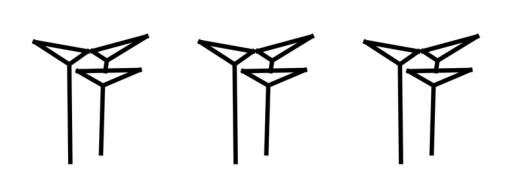

  0%|          | 0/50 [00:00<?, ?it/s]

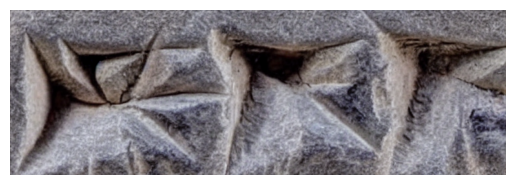

Generated image saved to: /content/drive/My Drive/DL_project/Santakku/generated_images/generated_A_A_A.png


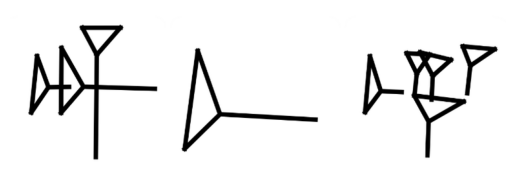

  0%|          | 0/50 [00:00<?, ?it/s]

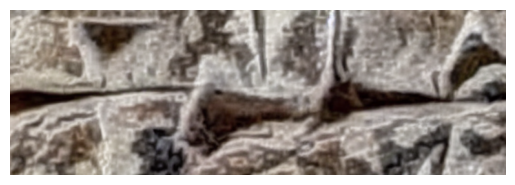

Generated image saved to: /content/drive/My Drive/DL_project/Santakku/generated_images/generated_AN_ASH_SUR.png


In [ ]:
# Define the paths to your skeleton images and text prompts
# stitched_skeletons_dir = "/content/drive/My Drive/DL_project/Santakku/stitched_skeletons"
stitched_skeletons_dir = "/content/drive/My Drive/DL_project/Santakku/control"
output_dir = "/content/drive/My Drive/DL_project/generated_controlnet_before_finetuning_300"
os.makedirs(output_dir, exist_ok=True)


# Generate images
for skeleton_name, prompt in skeleton_to_prompt.items():
    skeleton_path = os.path.join(stitched_skeletons_dir, skeleton_name)
    skeleton_image = preprocess_skeleton(skeleton_path)

    # Generate image with ControlNet
    result = pipe(
        prompt,
        image=skeleton_image,
        height=256,
        width=768,
        # num_inference_steps=50,  # Adjust for desired inference steps
        # guidance_scale=7.5,     # Adjust for desired text-image consistency
        # control_strength=1.0,
        # controlnet_guidance_scale=10.0
    )

    # Save generated image
    output_path = os.path.join(output_dir, f"generated_{skeleton_name}")
    result.images[0].save(output_path)

    # Display the image using Matplotlib
    plt.imshow(result.images[0])
    plt.axis("off")  # Turn off axis for cleaner visualization
    plt.show()
    print(f"Generated image saved to: {output_path}")


In [ ]:
# Define paths and directories
stitched_skeletons_dir = "/content/drive/My Drive/DL_project/Santakku/control"
output_dir = "/content/drive/My Drive/DL_project/generated_controlnet_before_finetuning_300"
os.makedirs(output_dir, exist_ok=True)

# Define a dictionary of 20 skeletons and their prompts
# skeleton_to_prompt = {
#     f"AN_ASH_SUR.png": f"cuneiform 3 ancient icons in a horizontal row, variation {i}"
#     for i in range(20)
# }
# skeleton_to_prompt = {}
# for filename in os.listdir(stitched_skeletons_dir):
#     if filename.endswith(".png"):
#         name_without_ext = os.path.splitext(filename)[0].replace("_", " ")

#         # prompt = f"cuneiform 3 ancient icons: {name_without_ext}"
#         prompt = f"cuneiform 3 icons in a row"
#         skeleton_to_prompt[filename] = prompt

# print(skeleton_to_prompt)

base_prompt = "cuneiform 3 icons in a row"
for skeleton_name, prompt in skeleton_to_prompt.items():
      skeleton_path = os.path.join(stitched_skeletons_dir, skeleton_name)
      skeleton_image = preprocess_skeleton(skeleton_path)
      for i in range(60):
          # Generate a unique prompt by adding variations
          prompt_variation = f"{base_prompt}, variation {i+1}"



          # Generate image with ControlNet
          result = pipe(
              prompt_variation,
              image=skeleton_image,
              height=256,
              width=768,
              num_inference_steps=random.randint(30, 70),  # Randomize for diversity
              guidance_scale=random.uniform(7.0, 10.0),   # Adjust for text adherence
          )

          # Save generated image
          name_3icon=skeleton_name.replace(".png","")
          output_path = os.path.join(output_dir, f"generated_{name_3icon}_variation_{i+1}.png")
          result.images[0].save(output_path)

          # Display the image using Matplotlib
          plt.imshow(result.images[0])
          plt.axis("off")  # Turn off axis for cleaner visualization
          plt.show()
          print(f"Generated image saved to: {output_path}")


# Finetune Control-Net

In [ ]:
import os
from PIL import Image

# 文件夹路径
base_dir = "/content/drive/My Drive/DL_project/finetuneCN"
output_dir = "/content/drive/My Drive/DL_project/finetuneCN_merged"
os.makedirs(output_dir, exist_ok=True)  # 创建输出文件夹

# 遍历 finetuneCN 文件夹中的所有子文件夹
for subfolder in os.listdir(base_dir):
    subfolder_path = os.path.join(base_dir, subfolder)
    if not os.path.isdir(subfolder_path):  # 跳过非文件夹
        continue

    # 提取文件夹中的图片
    three_underscore_image = None
    single_underscore_images = {}
    final_result_images = {}

    for filename in os.listdir(subfolder_path):
        file_path = os.path.join(subfolder_path, filename)

        if filename.count("_") == 3 and filename.endswith(".jpg"):
            three_underscore_image = filename  # 获取三个下划线的图片名
        elif filename.endswith("final_result_100.png"):
            final_result_images[filename.split("_")[0]] = file_path  # 按名字提取
        elif filename.count("_") == 1 and filename.endswith(".png"):
            single_underscore_images[filename.split("_")[0]] = file_path  # 按名字提取

    if not three_underscore_image:
        print(f"No image with three underscores found in {subfolder}")
        continue

    # 获取图片名的顺序
    name_order = three_underscore_image.split(".")[0].split("_")
    print(f"Processing {subfolder} with order: {name_order}")

    # 对 `final_result_100.png` 图片进行横向拼接
    if len(final_result_images) == 3:
        images = [Image.open(final_result_images[name]) for name in name_order if name in final_result_images]
        if images:
            widths, heights = zip(*(img.size for img in images))

            total_width = sum(widths)
            max_height = max(heights)

            skeleton_image = Image.new("RGB", (total_width, max_height))
            x_offset = 0
            for img in images:
                skeleton_image.paste(img, (x_offset, 0))
                x_offset += img.width

            # 保存 skeleton 合并后的图片
            skeleton_output_path = os.path.join(output_dir, f"skeleton_{subfolder}.png")
            skeleton_image.save(skeleton_output_path)
            print(f"Skeleton saved: {skeleton_output_path}")

    # 对单下划线的图片进行拉伸并横向拼接
    if len(single_underscore_images) == 3:
        images = [Image.open(single_underscore_images[name]).resize((481, 481)) for name in name_order if name in single_underscore_images]
        if images:
            total_width = sum(img.width for img in images)
            max_height = max(img.height for img in images)

            image = Image.new("RGB", (total_width, max_height))
            x_offset = 0
            for img in images:
                image.paste(img, (x_offset, 0))
                x_offset += img.width

            # 保存 image 合并后的图片
            image_output_path = os.path.join(output_dir, f"image_{subfolder}.png")
            image.save(image_output_path)
            print(f"Image saved: {image_output_path}")


Processing DISH_AN_ASH_6 with order: ['DISH', 'AN', 'ASH', '6']
Skeleton saved: /content/drive/My Drive/DL_project/finetuneCN_merged/skeleton_DISH_AN_ASH_6.png
Image saved: /content/drive/My Drive/DL_project/finetuneCN_merged/image_DISH_AN_ASH_6.png
Processing AN_ASH_SUR_29 with order: ['AN', 'ASH', 'SUR', '29']
Skeleton saved: /content/drive/My Drive/DL_project/finetuneCN_merged/skeleton_AN_ASH_SUR_29.png
Image saved: /content/drive/My Drive/DL_project/finetuneCN_merged/image_AN_ASH_SUR_29.png
Processing ASH_SUR_KAK_73 with order: ['ASH', 'SUR', 'KAK', '73']
Skeleton saved: /content/drive/My Drive/DL_project/finetuneCN_merged/skeleton_ASH_SUR_KAK_73.png
Image saved: /content/drive/My Drive/DL_project/finetuneCN_merged/image_ASH_SUR_KAK_73.png


In [ ]:
import os
from PIL import Image
from torch.utils.data import Dataset
from torchvision import transforms

# 文件夹路径
merged_dir = "/content/drive/My Drive/DL_project/finetuneCN_merged"

# 数据集类
class SkeletonImageDataset(Dataset):
    def __init__(self, merged_dir, transform=None):
        self.skeleton_files = sorted([f for f in os.listdir(merged_dir) if f.startswith("skeleton_")])
        self.image_files = sorted([f for f in os.listdir(merged_dir) if f.startswith("image_")])
        self.merged_dir = merged_dir
        self.transform = transform

        assert len(self.skeleton_files) == len(self.image_files), "Skeleton and image file counts do not match."

    def __len__(self):
        return len(self.skeleton_files)

    def __getitem__(self, idx):
        skeleton_path = os.path.join(self.merged_dir, self.skeleton_files[idx])
        image_path = os.path.join(self.merged_dir, self.image_files[idx])

        skeleton = Image.open(skeleton_path).convert("RGB")
        target_image = Image.open(image_path).convert("RGB")

        if self.transform:
            skeleton = self.transform(skeleton)
            target_image = self.transform(target_image)

        return {"skeleton": skeleton, "target_image": target_image}


In [ ]:
from torch.utils.data import DataLoader
# Ensure correct transforms for skeleton and target images
transform = transforms.Compose([
    transforms.Resize((256, 768)),  # Adjust to match your model input size
    transforms.ToTensor(),
    transforms.Normalize([0.5], [0.5]),
])


dataloader = DataLoader(dataset, batch_size=1, shuffle=True)
dataset = SkeletonImageDataset(merged_dir, transform=transform)



In [ ]:
from diffusers import ControlNetModel, StableDiffusionControlNetPipeline, DDIMScheduler
from torch.optim import AdamW
import torch

# Load ControlNet and Stable Diffusion pipeline
controlnet = ControlNetModel.from_pretrained(
    "/content/drive/My Drive/DL_project/ControlNet",
    torch_dtype=torch.float16
)

pipe = StableDiffusionControlNetPipeline.from_pretrained(
    "/content/drive/My Drive/DL_project/SD_without_prompt",
    controlnet=controlnet,
    safety_checker=None,
    torch_dtype=torch.float16,
).to("cuda")




Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


In [ ]:
from torchvision.transforms.functional import resize

# 定义联合数据增强的 transform
class PairedTransform:
    def __init__(self, transforms_list):
        self.transforms = transforms_list

    def __call__(self, skeleton, target_image):
        for t in self.transforms:
            skeleton, target_image = t(skeleton, target_image)
        return skeleton, target_image

# 定义增强操作
class RandomHorizontalFlip:
    def __call__(self, skeleton, target_image):
        if torch.rand(1) > 0.5:
            skeleton = transforms.functional.hflip(skeleton)
            target_image = transforms.functional.hflip(target_image)
        return skeleton, target_image

class RandomVerticalFlip:
    def __call__(self, skeleton, target_image):
        if torch.rand(1) > 0.5:
            skeleton = transforms.functional.vflip(skeleton)
            target_image = transforms.functional.vflip(target_image)
        return skeleton, target_image

# 联合数据增强 transform
paired_transforms = PairedTransform([
    RandomHorizontalFlip(),
    RandomVerticalFlip(),
    lambda s, t: (transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2)(s),
                  transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2)(t)),
    lambda s, t: (transforms.ToTensor()(s), transforms.ToTensor()(t)),
    lambda s, t: (transforms.Normalize((0.5,), (0.5,))(s), transforms.Normalize((0.5,), (0.5,))(t))
])

# 数据集类
class SkeletonImageDataset(Dataset):
    def __init__(self, merged_dir, transform=None, augment_multiplier=1, target_size=(256, 768)):
        self.skeleton_files = sorted([f for f in os.listdir(merged_dir) if f.startswith("skeleton_")])
        self.image_files = sorted([f for f in os.listdir(merged_dir) if f.startswith("image_")])
        self.merged_dir = merged_dir
        self.transform = transform
        self.augment_multiplier = augment_multiplier
        self.target_size = target_size  # 新增：目标大小

        assert len(self.skeleton_files) == len(self.image_files), "Skeleton and image file counts do not match."

        # 数据集扩展倍数
        self.expanded_len = len(self.skeleton_files) * self.augment_multiplier

    def __len__(self):
        return self.expanded_len

    def __getitem__(self, idx):
        # 根据扩展倍数索引数据
        original_idx = idx % len(self.skeleton_files)

        skeleton_path = os.path.join(self.merged_dir, self.skeleton_files[original_idx])
        image_path = os.path.join(self.merged_dir, self.image_files[original_idx])

        skeleton = Image.open(skeleton_path).convert("RGB")
        target_image = Image.open(image_path).convert("RGB")

        # 调整尺寸到目标大小
        skeleton = resize(skeleton, self.target_size)
        target_image = resize(target_image, self.target_size)

        # 应用增强
        if self.transform:
            skeleton, target_image = self.transform(skeleton, target_image)

        return {"skeleton": skeleton, "target_image": target_image}

# 加载数据
merged_dir = "/content/drive/My Drive/DL_project/finetuneCN_merged"
dataset = SkeletonImageDataset(merged_dir, transform=paired_transforms, augment_multiplier=7, target_size=(256, 768))

# DataLoader
dataloader = DataLoader(dataset, batch_size=1, shuffle=True)

# # 验证并展示
# def show_images(dataset, num_images=20):
#     fig, axes = plt.subplots(4, 5, figsize=(15, 12))  # 创建一个 4x5 的网格
#     axes = axes.flatten()

#     for i in range(min(num_images, len(dataset))):
#         data = dataset[i]
#         skeleton = data["skeleton"]
#         target_image = data["target_image"]

#         # 将张量转换为PIL图像
#         skeleton_img = transforms.ToPILImage()(skeleton)
#         target_img = transforms.ToPILImage()(target_image)

#         # 展示图像
#         axes[i].imshow(skeleton_img)
#         axes[i].set_title(f"Skeleton {i+1}")
#         axes[i].axis("off")

#         # 同一网格展示对应的目标图像
#         axes[i].imshow(target_img, alpha=0.5)

#     plt.tight_layout()
#     plt.show()

# # 展示增强后的数据
# show_images(dataset, num_images=20)


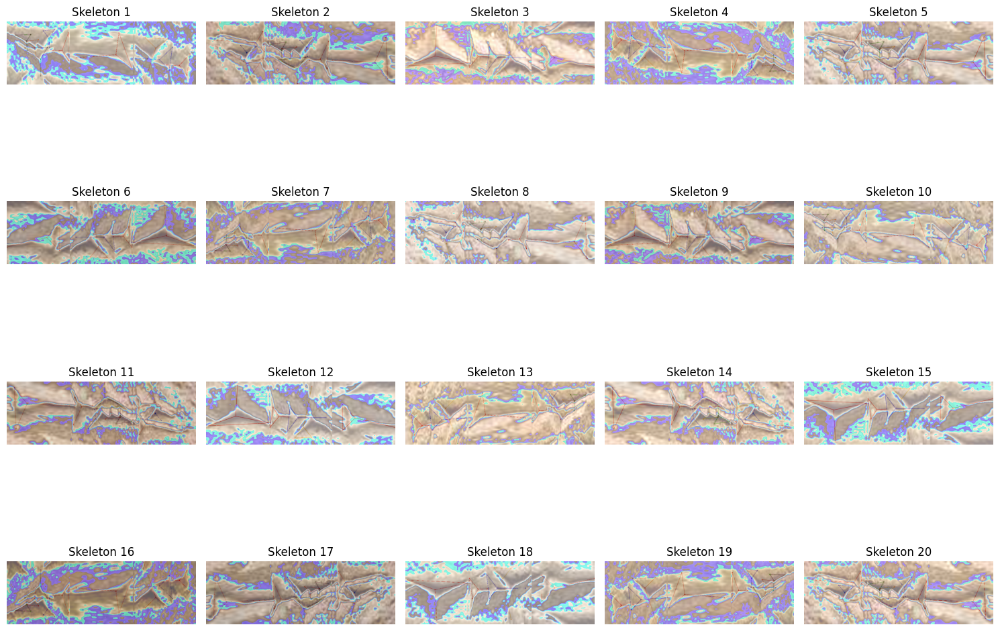

In [ ]:
import matplotlib.pyplot as plt
from torchvision.transforms.functional import to_pil_image

# 展示图片的函数
def show_images(dataset, num_images=20):
    fig, axes = plt.subplots(4, 5, figsize=(15, 12))  # 创建一个 4x5 的网格
    axes = axes.flatten()

    for i in range(min(num_images, len(dataset))):
        data = dataset[i]
        skeleton = data["skeleton"]
        target_image = data["target_image"]

        # 将张量转换为PIL图像
        skeleton_img = to_pil_image(skeleton)
        target_img = to_pil_image(target_image)

        # 展示图像
        axes[i].imshow(skeleton_img)
        axes[i].set_title(f"Skeleton {i+1}")
        axes[i].axis("off")

        # 同一网格展示对应的目标图像
        axes[i].imshow(target_img, alpha=0.5)

    plt.tight_layout()
    plt.show()

# 展示增强过的所有图像
show_images(dataset, num_images=20)  # 设定展示20张图像


Epoch 1: 0.1593
Epoch 2: 0.1963
Epoch 3: 0.0796
Epoch 4: 0.2001
Epoch 5: 0.1495

In [ ]:
from peft import LoraConfig, get_peft_model
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, DDIMScheduler
from tqdm import tqdm
import torch

# 初始化 LoRA 配置
# lora_config = LoraConfig(
#     r=16,  # 矩阵秩
#     lora_alpha=32,  # 缩放因子
#     target_modules=["to_k", "to_q"],  # LoRA 作用的模块
#     lora_dropout=0.1,
#     bias="none",
#     task_type="UNET"  # 任务类型
# )
lora_config = LoraConfig(
    r=16,
    lora_alpha=32,
    target_modules=[
        "down_blocks.0.attentions.0.transformer_blocks.0.attn1.to_q",
        "down_blocks.0.attentions.0.transformer_blocks.0.attn1.to_k",
        "down_blocks.1.attentions.0.transformer_blocks.0.attn1.to_q",
        "down_blocks.1.attentions.0.transformer_blocks.0.attn1.to_k",
    ],
    lora_dropout=0.1,
    task_type="UNET"
)

pipe.controlnet.train()

# lora_config = LoraConfig(
#     r=8,
#     lora_alpha=16,
#     target_modules=["to_q", "to_k", "to_v"],
#     lora_dropout=0.1,
#     task_type="IMAGE_GENERATION"
# )

# 包装模型
pipe.controlnet = get_peft_model(pipe.controlnet, lora_config)

# 确保模型处于训练模式
pipe.controlnet.train()


# 使用 LoRA 包装 ControlNet
pipe.controlnet = get_peft_model(pipe.controlnet, lora_config)

# 冻结其他参数，只训练 LoRA 层
# pipe.controlnet.requires_grad_(False)
pipe.controlnet.train()  # LoRA 层需要被设置为可训练

# 检查模型中可训练的参数
trainable_params = sum(p.numel() for p in pipe.controlnet.parameters() if p.requires_grad)
print(f"Trainable parameters with LoRA: {trainable_params}")

# 定义优化器
optimizer = AdamW(pipe.controlnet.parameters(), lr=1e-5)
num_epochs = 10

# 训练循环
epoch_losses = []  # 用于存储每个 epoch 的损失

for epoch in range(num_epochs):
    pipe.unet.train()
    epoch_loss = 0  # 初始化当前 epoch 的总损失
    num_batches = 0  # 记录 batch 数量

    progress_bar = tqdm(dataloader, desc=f"Epoch {epoch+1}/{num_epochs}")
    for batch in progress_bar:
        skeleton = batch["skeleton"].to("cuda", dtype=torch.float16)
        target_image = batch["target_image"].to("cuda", dtype=torch.float16)

        # 生成文本提示
        prompt = "cuneiform 3 ancient icons"
        inputs = pipe.tokenizer(
            prompt,
            padding="max_length",
            max_length=pipe.tokenizer.model_max_length,
            truncation=True,
            return_tensors="pt"
        ).to("cuda")

        # 提取文本嵌入
        encoder_hidden_states = pipe.text_encoder(inputs.input_ids).last_hidden_state

        # 将目标图像编码到 latent 空间
        with torch.no_grad():
            latents = pipe.vae.encode(target_image).latent_dist.sample()
            latents = latents * pipe.vae.config.scaling_factor

        # 添加噪声到 latent 表示
        noise = torch.randn_like(latents)
        timesteps = torch.randint(0, pipe.scheduler.config.num_train_timesteps, (latents.shape[0],), device=latents.device).long()
        noisy_latents = pipe.scheduler.add_noise(latents, noise, timesteps)

        # 前向传播
        model_pred = pipe.unet(
            noisy_latents, timesteps, encoder_hidden_states=encoder_hidden_states
        ).sample

        # 计算损失
        loss = torch.nn.functional.mse_loss(model_pred, noise)
        epoch_loss += loss.item()  # 累加当前 batch 的损失
        num_batches += 1

        # 反向传播
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        # 更新进度条
        progress_bar.set_postfix({"batch_loss": loss.item()})

    # 计算并存储当前 epoch 的平均损失
    average_loss = epoch_loss / num_batches
    epoch_losses.append(average_loss)

    print(f"Epoch {epoch+1}/{num_epochs}, Average Loss: {average_loss:.4f}")

    # 保存 LoRA 权重
    pipe.controlnet.save_pretrained(f"fine_tuned_lora_sd_controlnet_epoch_{epoch+1}")

# 输出所有 epoch 的损失
print("Training complete. Loss per epoch:")
for i, loss in enumerate(epoch_losses, 1):
    print(f"Epoch {i}: {loss:.4f}")


Trainable parameters with LoRA: 61440


Epoch 1/10: 100%|██████████| 21/21 [00:04<00:00,  4.48it/s, batch_loss=0.129]


Epoch 1/10, Average Loss: 0.1894


Epoch 2/10: 100%|██████████| 21/21 [00:04<00:00,  4.54it/s, batch_loss=0.316]


Epoch 2/10, Average Loss: 0.1740


Epoch 3/10: 100%|██████████| 21/21 [00:04<00:00,  4.49it/s, batch_loss=0.15]


Epoch 3/10, Average Loss: 0.1367


Epoch 4/10: 100%|██████████| 21/21 [00:04<00:00,  4.55it/s, batch_loss=0.113]


Epoch 4/10, Average Loss: 0.1683


Epoch 5/10: 100%|██████████| 21/21 [00:04<00:00,  4.51it/s, batch_loss=0.0691]


Epoch 5/10, Average Loss: 0.1199


Epoch 6/10: 100%|██████████| 21/21 [00:04<00:00,  4.54it/s, batch_loss=0.161]


Epoch 6/10, Average Loss: 0.0811


Epoch 7/10: 100%|██████████| 21/21 [00:04<00:00,  4.53it/s, batch_loss=0.0416]


Epoch 7/10, Average Loss: 0.1948


Epoch 8/10: 100%|██████████| 21/21 [00:04<00:00,  4.48it/s, batch_loss=0.116]


Epoch 8/10, Average Loss: 0.1516


Epoch 9/10: 100%|██████████| 21/21 [00:04<00:00,  4.48it/s, batch_loss=0.0367]


Epoch 9/10, Average Loss: 0.2596


Epoch 10/10: 100%|██████████| 21/21 [00:04<00:00,  4.43it/s, batch_loss=0.532]

Epoch 10/10, Average Loss: 0.2150
Training complete. Loss per epoch:
Epoch 1: 0.1894
Epoch 2: 0.1740
Epoch 3: 0.1367
Epoch 4: 0.1683
Epoch 5: 0.1199
Epoch 6: 0.0811
Epoch 7: 0.1948
Epoch 8: 0.1516
Epoch 9: 0.2596
Epoch 10: 0.2150


Trainable parameters with LoRA: 0
Epoch 1/5: 100%|██████████| 21/21 [00:04<00:00,  4.40it/s, batch_loss=0.111]
Epoch 1/5, Average Loss: 0.1814
Epoch 2/5: 100%|██████████| 21/21 [00:04<00:00,  4.48it/s, batch_loss=0.0123]
Epoch 2/5, Average Loss: 0.1412
Epoch 3/5: 100%|██████████| 21/21 [00:04<00:00,  4.49it/s, batch_loss=0.634]
Epoch 3/5, Average Loss: 0.2250
Epoch 4/5: 100%|██████████| 21/21 [00:04<00:00,  4.44it/s, batch_loss=0.00251]
Epoch 4/5, Average Loss: 0.1348
Epoch 5/5: 100%|██████████| 21/21 [00:04<00:00,  4.52it/s, batch_loss=0.271]Epoch 5/5, Average Loss: 0.0885
Training complete. Loss per epoch:
Epoch 1: 0.1814
Epoch 2: 0.1412
Epoch 3: 0.2250
Epoch 4: 0.1348
Epoch 5: 0.0885


In [ ]:
for name, module in pipe.unet.named_modules():
    print(name)



conv_in
time_proj
time_embedding
time_embedding.linear_1
time_embedding.act
time_embedding.linear_2
down_blocks
down_blocks.0
down_blocks.0.attentions
down_blocks.0.attentions.0
down_blocks.0.attentions.0.norm
down_blocks.0.attentions.0.proj_in
down_blocks.0.attentions.0.transformer_blocks
down_blocks.0.attentions.0.transformer_blocks.0
down_blocks.0.attentions.0.transformer_blocks.0.norm1
down_blocks.0.attentions.0.transformer_blocks.0.attn1
down_blocks.0.attentions.0.transformer_blocks.0.attn1.to_q
down_blocks.0.attentions.0.transformer_blocks.0.attn1.to_k
down_blocks.0.attentions.0.transformer_blocks.0.attn1.to_v
down_blocks.0.attentions.0.transformer_blocks.0.attn1.to_out
down_blocks.0.attentions.0.transformer_blocks.0.attn1.to_out.0
down_blocks.0.attentions.0.transformer_blocks.0.attn1.to_out.1
down_blocks.0.attentions.0.transformer_blocks.0.norm2
down_blocks.0.attentions.0.transformer_blocks.0.attn2
down_blocks.0.attentions.0.transformer_blocks.0.attn2.to_q
down_blocks.0.attenti